<a href="https://colab.research.google.com/github/joaonart/mcz-m2-t7-recinf/blob/master/notebooks/MCZ_M2_T7_RECINF_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<head>
  <meta name="author" content="João Alves">
  <meta institution="author" content="Universidade Presbiteriana Mackenzie">
</head>

<img src="http://meusite.mackenzie.br/rogerio/mackenzie_logo/UPM.2_horizontal_vermelho.jpg" width=300, align="right"> 

<h1 align=left><font size = 8, style="color:rgb(200,0,0)"><b>Ciência de Dados </b></font></h1> 
<h1 align=left><font size = 5, style="color:rgb(0,0,0)"><b>Recuperação da Informação na Web e em Redes Sociais</b></font></h1> 

# 1 Trilha 7 - Tarefa de aprofundamento
Professor: *Luciano Moreira Camilo e Silva* 

Aluno: João Alves
<br>
<br>

---


# Introdução 

A melhor forma de fixar o conteúdo aprendido é através da prática. Utilizando a fonte de dados disponibilizada para o ano de 2018 de voos brasileiros pela ANAC (dados tratados no GitHub do professor) monte uma rede complexa com as cidades brasileiras e responda as seguintes perguntas abaixo.

- Qual o grau médio, ou seja, número de outros aeroportos conectados, dos aeroportos brasileiros com voos em 2018?
- Qual aeroporto brasileiro voava, em 2018, para mais cidades distintas?
- Quais são os dois aeroportos que precisavam em 2018 de mais escalas para se interligarem?

Executar o exercício no Google Colab e deixar documentado, em texto, suas respostas. Enviar o link para o professor. LEMBRAR DE DEIXAR O LINK PÚBLICO.




# Instalando as bibliotecas python

In [36]:
!pip install networkx

# Importando as bibliotecas python

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import math

# Funções de Apoio para Montagem do Grafo

In [50]:
def monta_pos(IATA):
    airport_pos_df = airport_df.loc[airport_df['IATA'].isin(IATA)][['IATA', 'Lat', 'Long']]
    airport_pos_df.reset_index(inplace=True)

    pos = {}
    for index, elem in enumerate (airport_pos_df['IATA']):
        pos[elem] = (airport_pos_df.loc[index ,'Long'], airport_pos_df.loc[index ,'Lat'])

    found = len(airport_pos_df.loc[~airport_pos_df['Lat'].isnull()])
    print(f'{found} Aeroportos com Lat, Long')

    return pos

In [51]:
def routes_top(routes_grouped_df, top):
    return routes_grouped_df.head(top)['IATA_orig'],routes_grouped_df

In [53]:
def monta_rotas(ano, top):
    # Define nomes mais fáceis de manipular para a tabela
    routes_col = ['company_id', 'flight_no', 'auth_code', 'line_code','ICAO_orig', 'ICAO_dest',
        'depature_estimated', 'depature_time', 'arrival_estimated', 'arriaval_time',
        'flight_status', 'flight_status_cause_code', 'ano', 'mes']
    
    #Carrega a lista do ano, porém elimina os voos cancelados
    #routes_df = pd.read_csv(f"/content/drive/MyDrive/VRA/VRA_ANO_{ano}.csv"
    routes_df = pd.read_csv(f"../data/VRA_ANO_{ano}.csv", header=0, names = routes_col, index_col = 0)
    routes_df = routes_df.loc[routes_df['flight_status'] != 'CANCELADO']

    #Agrupa, mantendo só o que entrará no grafo
    routes_grouped_df = routes_df.groupby(['ICAO_orig', 'ICAO_dest']).size().reset_index(name='counts')

    #Faz a junção com o Airport.dat para trocar para o código de três letras
    
    #Join origem
    routes_grouped_df = routes_grouped_df.merge(airport_df[['ICAO', 'IATA', 'Lat', 'Long', 'Country']], how='left', left_on='ICAO_orig', right_on='ICAO')
    routes_grouped_df = routes_grouped_df[['IATA', 'Country', 'ICAO_dest', 'counts']]
    routes_grouped_df.rename(columns={'IATA': 'IATA_orig', 'Country': 'Country_orig'}, inplace = True)
    
    #Join destino
    routes_grouped_df = routes_grouped_df.merge(airport_df[['ICAO', 'IATA', 'Lat', 'Long', 'Country']], how='left', left_on='ICAO_dest', right_on='ICAO')
    routes_grouped_df = routes_grouped_df[['IATA_orig', 'Country_orig', 'IATA', 'Country', 'counts']]
    routes_grouped_df.rename(columns={'IATA': 'IATA_dest', 'Country': 'Country_dest'}, inplace = True)

    #Filtra somente Brazil e mantém somente as colunas necessárias
    routes_grouped_df = (routes_grouped_df
        .loc[routes_grouped_df['Country_orig'] == 'Brazil']
        .loc[routes_grouped_df['Country_dest'] == 'Brazil']
        .loc[routes_grouped_df['IATA_orig'] != routes_grouped_df['IATA_dest']]
        .loc[routes_grouped_df['IATA_orig'].str.len() == 3]
        .loc[routes_grouped_df['IATA_dest'].str.len() == 3]
        .sort_values(by=['counts'], ascending=False)
        )
    routes_grouped_df = routes_grouped_df[['IATA_orig', 'IATA_dest', 'counts']]

    #Prepara os DataFrames que serão utilizados
    IATA, routes_grouped_df_top = routes_top(routes_grouped_df, top)
    pos = monta_pos(IATA)
    return routes_grouped_df_top, pos

# Processamento e Exibição do Grafo

/var/folders/vt/fgngxzf118n_6mh9gb0609rm0000gn/T/ipykernel_20741/756103801.py:9: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  routes_df = pd.read_csv(f"../data/VRA_ANO_{ano}.csv", header=0, names = routes_col, index_col = 0)


1 Aeroportos com Lat, Long


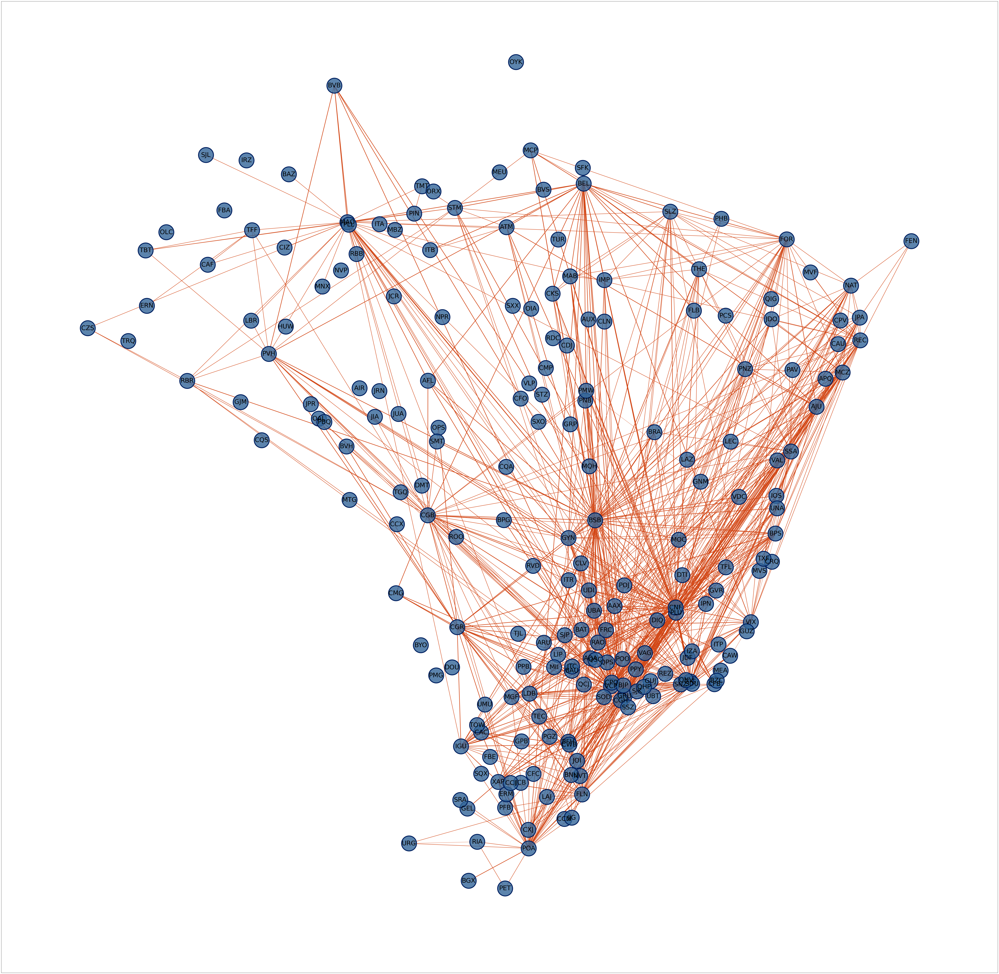

In [54]:
G = nx.Graph()
pos = {}
airport_col = ['ID','Name','City','Country','IATA','ICAO','Lat','Long','Alt','Timezone','DST','Tz database time zone','type','source']
airport_df = pd.read_csv("https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat", names=airport_col, index_col=0)

airport_brasil_df = airport_df.loc[airport_df['Country']=='Brazil'].loc[airport_df['IATA'].str.len()==3]
airport_brasil_df.reset_index(inplace=True)

for index, elem in enumerate(airport_brasil_df['IATA']):
    G.add_node(airport_brasil_df.loc[index, 'IATA'])
    pos[elem] = (airport_brasil_df.loc[index, 'Long'], airport_brasil_df.loc[index, 'Lat'])

#Ignorar pos, já adicionei todos os aeroportos
routes, pos_ignore = monta_rotas(2018, 1)
routes.reset_index(inplace=True)
for index, elem in enumerate(routes['IATA_orig']):
    G.add_edge(routes.loc[index, 'IATA_orig'], routes.loc[index, 'IATA_dest'])

options = {
    "font_size": 36, "node_size": 7000,
    "node_color": "#336699CC", "edgecolors": "#002060",
    "edge_color": "#D34817", "linewidths": 5,
    "width":[1+int(math.log(x,30)) for x in routes['counts'].to_list()],
    "with_labels": True
}

plt.figure(figsize=(100,100))
nx.draw_networkx(G, pos, **options)

# Respondendo as Perguntas

## Qual o grau médio, ou seja, número de outros aeroportos conectados, dos aeroportos brasileiros com voos em 2018?

In [ ]:
#Qual o grau médio, ou seja, número de outros aeroportos conectados, dos aeroportos brasileiros com voos em 2018?


## Qual aeroporto brasileiro voava, em 2018, para mais cidades distintas?

In [ ]:
#Qual aeroporto brasileiro voava, em 2018, para mais cidades distintas?


## Quais são os dois aeroportos que precisavam em 2018 de mais escalas para se interligarem?

In [ ]:
#Quais são os dois aeroportos que precisavam em 2018 de mais escalas para se interligarem?


# Exportar Código Fonte

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!jupyter nbconvert --to html /content/drive/MyDrive/Colab\ Notebooks/MCZ_M2_T7_RECINF_Python.ipynb

In [ ]:
!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

In [ ]:
!jupyter nbconvert --to pdf /content/drive/MyDrive/Colab\ Notebooks/MCZ_M2_T7_RECINF_Python.ipynb